<h1><center>Сегментация изображений</center></h1>

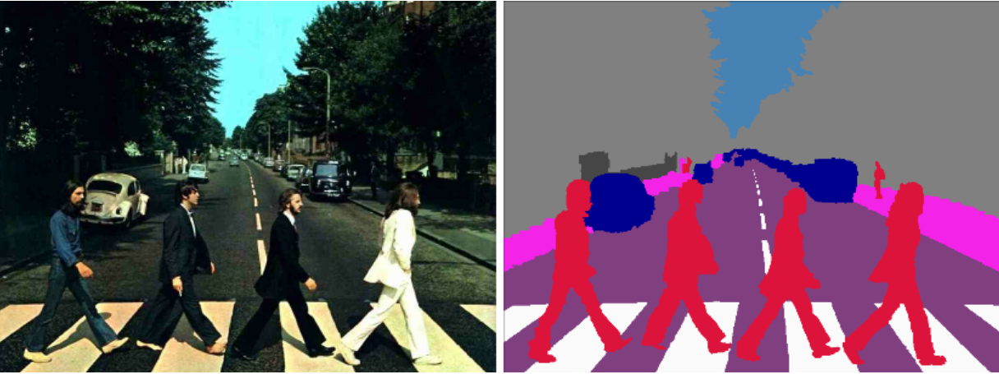

## Сегментация изображений

**Сегментация** — это задача компьютерного зрения, в которой каждому пикселю изображения присваивается метка класса. В отличие от классической классификации (где всему изображению соответствует одна метка), сегментация работает на уровне отдельных пикселей, обеспечивая **попиксельную классификацию**.

Существует два основных типа сегментации:

### 1. Семантическая сегментация  
Каждому пикселю изображения присваивается метка, соответствующая его семантическому классу (например, «дорога», «автомобиль», «человек»). При этом все объекты одного и того же класса рассматриваются **как единое целое**, без различия между отдельными экземплярами.

> **Пример**: если на изображении находятся два автомобиля, семантическая сегментация пометит все их пиксели как «автомобиль», но не будет различать, где заканчивается один и начинается другой.

### 2. Инстанс-сегментация  
Этот подход также присваивает метки пикселям, но дополнительно **разделяет объекты одного класса на отдельные инстансы** (экземпляры). То есть каждый объект получает уникальную идентификацию даже при принадлежности к одному и тому же классу.

> **Пример**: два автомобиля на изображении будут не только распознаны как «автомобиль», но и обособлены друг от друга — каждый получит свою маску сегментации.

---

### 🔍 Сравнение

| Тип сегментации          | Различает экземпляры? | Уровень детализации |
|--------------------------|------------------------|----------------------|
| Семантическая            | ❌                     | По классам           |
| Инстанс-сегментация     | ✅                     | По объектам          |

---

Инстанс-сегментация является более сложной задачей, поскольку требует не только классификации пикселей, но и выделения отдельных объектов, их локализации и уникальной идентификации.


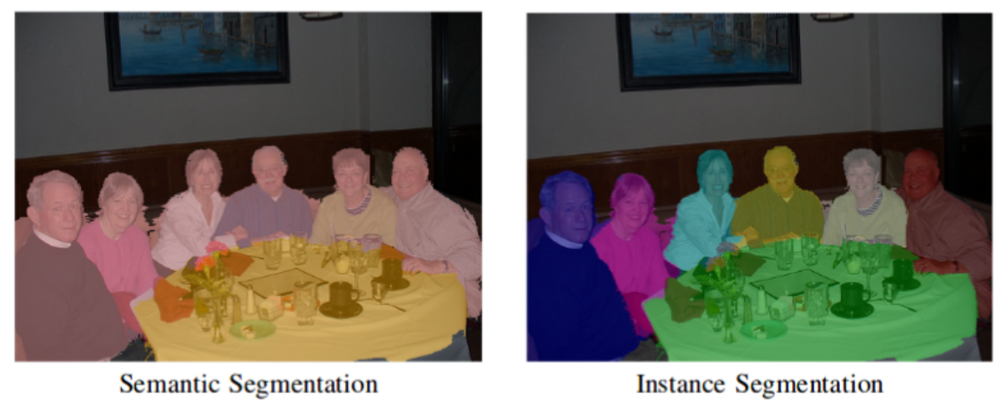

Для тренировки нейронных сетей решающих задачу сегментирования применяются свои специальные датасеты, в которых размечена маска изображения, например, такие как

- **PASCAL VOC** ([PASCAL Visual Object Classes](http://host.robots.ox.ac.uk/pascal/VOC/))  
- **COCO** ([Common Objects in Context](https://cocodataset.org/))

Датасетов для сегментации меньше и они сложнее в составлении. Поэтому существует распространенная практика использования предобученнной нейронной сети, например, на ImageNet, в качестве части отвественной за восприятие объектов. Затем уже нейронная сеть доубучается на размеченных масках с помощью специальных датасетов.

Иногда маски не хранят в растровом представлении, а используют маску в закодированном в последовательность виде, к примеру,

- **RLE (run-length encoding, кодирование длин серий)**

— алгоритм сжатия данных, заменяющий повторяющиеся символы (серии) на один символ и число его повторов. Серией называется последовательность, состоящая из нескольких одинаковых символов.

> **Пример**:  
> Исходная последовательность пикселей (1D для простоты):  
> `0 0 0 1 1 1 1 0 0 1 1`  
>  
> В RLE-кодировке она может быть представлена как:  
> `(3, 0), (4, 1), (2, 0), (2, 1)`  
> или, в случае бинарной маски (где 0 = фон), часто хранят только позиции и длины серий с `1`:  
> `4 4 10 2` — где каждая пара `(start, length)` описывает начало и длину объектной области.

In [1]:
def rle_decode(mask_rle, shape=(1080, 512, 1)):
    """
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background
    """
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)

    s = mask_rle.split()
    print(s)
    print(s[0:][::2], s[1:][::2])
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]

    starts -= 1

    ends = starts + lengths

    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1

    img = img.reshape(shape)
    return img

['3', '4', '10', '1', '15', '1', '17', '1', '24', '1', '33', '8']
['3', '10', '15', '17', '24', '33'] ['4', '1', '1', '1', '1', '8']


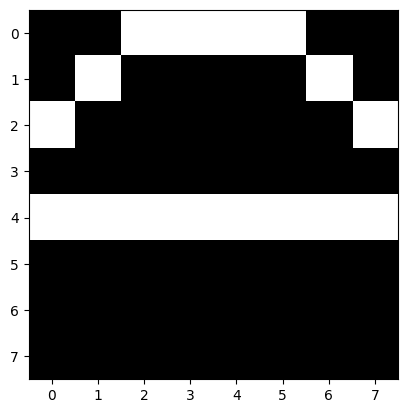

In [2]:
import numpy as np
import matplotlib.pyplot as plt


rle_string = "3 4 10 1 15 1 17 1 24 1 33 8"

mask = rle_decode(rle_string, shape=(8, 8))
plt.imshow(mask.reshape(8, 8), cmap="gray");

## слои для моделей сегментации



### Fully Convolutional Network

Одна из самых простых архитектур - это [FCN](https://towardsdatascience.com/review-fcn-semantic-segmentation-eb8c9b50d2d1) (Fully Convolutional Network). Это первая удачная попытка использования нейронной сети для задачи семантической сегментации. В этой архитектуре все слои сверточные. На выходе используется как правило один деконволюционный слой.
Одна из основных проблем - это низкое разрешение на выходе.


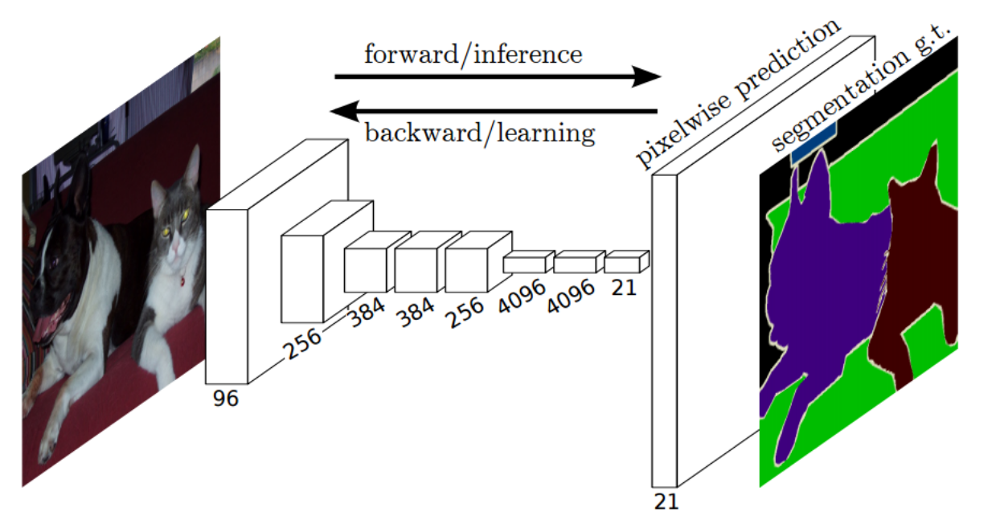

In [3]:
from torch import nn

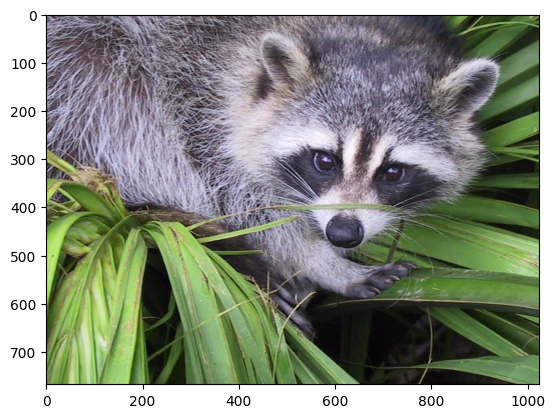

In [13]:
from scipy import datasets
from skimage import data
import torch
import matplotlib.pyplot as plt

img = datasets.face()
plt.imshow(img);

(34, 34, 3)


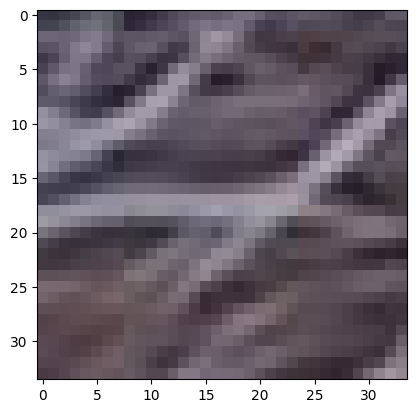

In [5]:
img = img[30:64, 40:74]
print(img.shape)
plt.imshow(img);

In [6]:
from torchvision.transforms import ToTensor

img_tensor = ToTensor()(img)
img_tensor.shape

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/torchvision/transforms/functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:209.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()


torch.Size([3, 34, 34])

## слой Upsample

визуализации работы слоев [https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md]
Слой UpSample- просто растягивает картинку. Параметры:

    scale_factor - "Во сколько раз увеличить"
        - scale_factor=2 - увеличить высоту и ширину в 2 раза
        - scale_factor=4 - увеличить в 4 раза

    size - "Какого размера хочу получить"

        - size=(64, 64) - хочу получить картинку точно 64x64 пикселей

        - Если задан size, scale_factor игнорируется

    mode - "Способ увеличения"

        - nearest - "ближайший сосед" - быстрый, но угловатый

        - bilinear - "плавное сглаживание" - медленнее, но качественнее

    align_corners - "Как выравнивать углы"

        - True - углы старой и новой картинки совпадают

        - False - углы могут немного сместиться


In [7]:
upsamle = nn.Upsample(
    scale_factor=(16, 16),
    mode="bilinear",
    #   mode='nearest',
)
# upsamle.weight

torch.Size([3, 544, 544])


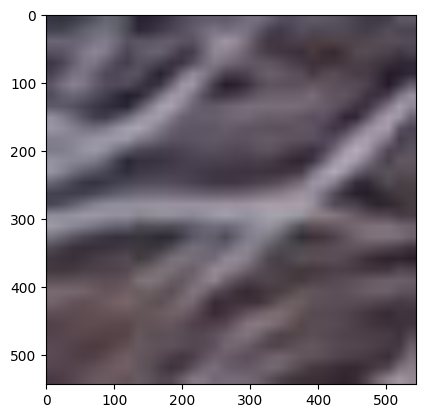

In [8]:
upsamled_img = upsamle(img_tensor[None])[0]
print(upsamled_img.shape)
plt.imshow(upsamled_img.permute(1, 2, 0));

## обратные свертки


ConvTranspose2d - "Умная сборка из кусочков":

    in_channels - "Сколько каналов на входе"
    out_channels - "Сколько каналов на выходе"

    kernel_size - "Размер фильтра-ядра"

    stride - "Шаг применения ядра"

        - stride=1 - ядро движется по каждому пикселю

        - stride=2 - ядро перепрыгивает через 1 пиксель

        - Большой stride = большее увеличение размера

    padding - "Добавление рамки вокруг картинки"

        - padding=1 - добавляем рамку в 1 пиксель вокруг


    dilation - "Растянутый фильтр"

    dilation=2 - пропуски в применении ядра делают его больше


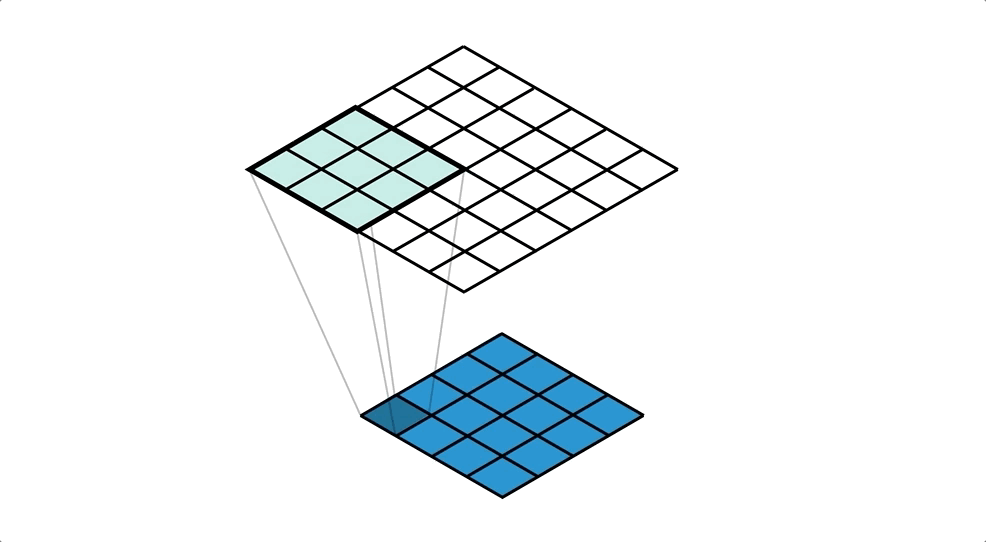

Применения ядра с шагом 1

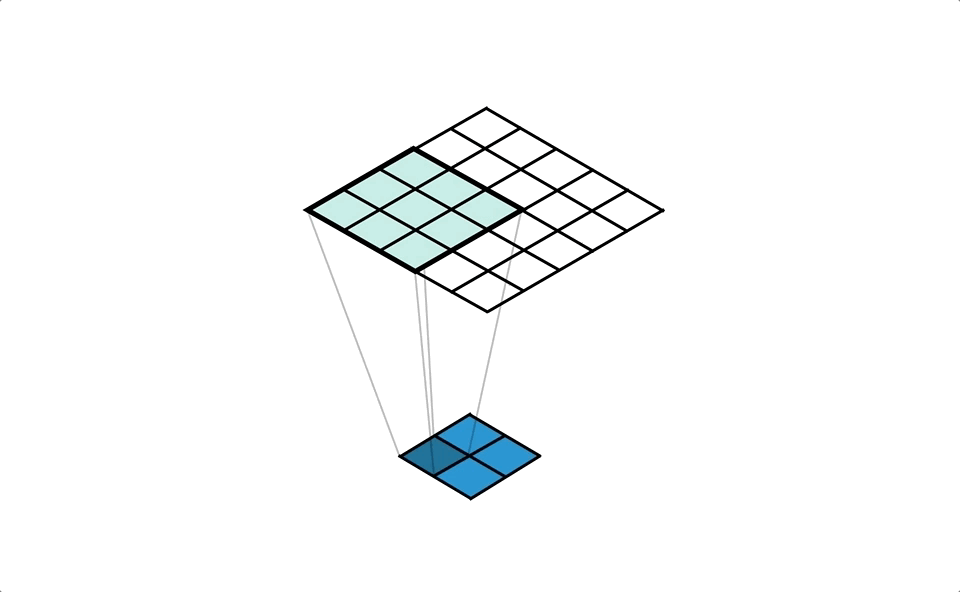

Применения ядра с шагом 2


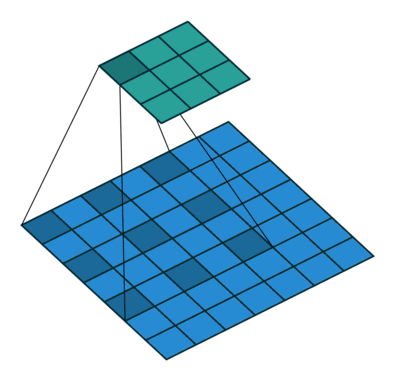

Применения ядра с dilation 2

In [9]:
conv = nn.ConvTranspose2d(in_channels=3, out_channels=3, stride=8, kernel_size=16)
conv.weight.shape

torch.Size([3, 3, 16, 16])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 280, 280])


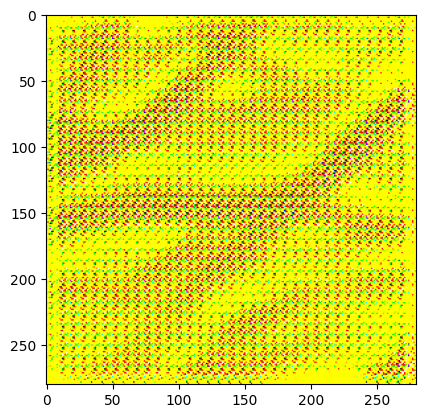

In [10]:
conv_img = conv(img_tensor[None])[0].detach().cpu()
print(conv_img.shape)
plt.imshow((conv_img.permute(1, 2, 0)* 255 ));

## Задание 1.


    1.1 загрузить изображение
    1.2 создать слой Upsample с коэффициентом масштаба : 2, 4, 8
    1.3. визуализировать результат


## Задание 2.


    1.1 загрузить изображение
    1.2 создать слой ConvTranspose2d с коэффициентом масштаба : 2, 4, 8
    1.3. визуализировать результат

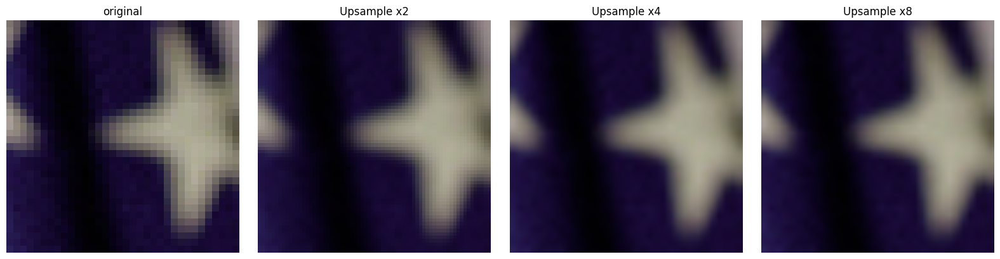

In [17]:
# 1
img = data.astronaut()
img = img[0:34, 10:44] 
img_tensor = ToTensor()(img) 

scales = [2, 4, 8]
fig, axes = plt.subplots(1, len(scales)+1, figsize=(4*(len(scales)+1), 4))

axes[0].imshow(img_tensor.permute(1,2,0))
axes[0].set_title("original")
axes[0].axis("off")

for ax, s in zip(axes[1:], scales):
    up = nn.Upsample(scale_factor=(s, s), mode="bilinear", align_corners=False)
    out = up(img_tensor[None])[0]
    ax.imshow(out.permute(1,2,0))
    ax.set_title(f"Upsample x{s}")
    ax.axis("off")

plt.tight_layout()
plt.show()

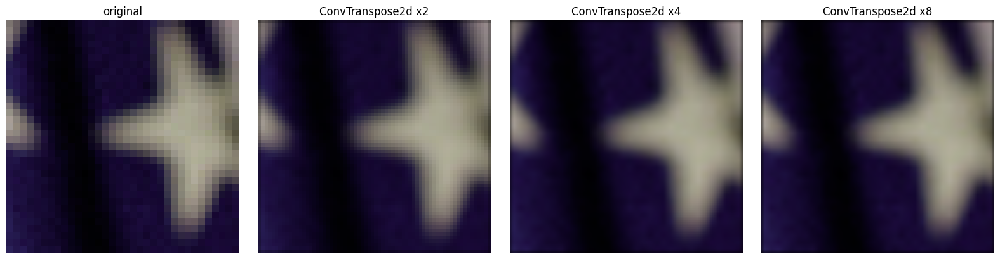

In [23]:
# 2
img = data.astronaut()
img = img[0:34, 10:44] 
img_tensor = ToTensor()(img)

def filter_bilinear(kernel_size: int) -> torch.Tensor:
    factor = (kernel_size + 1) // 2
    if kernel_size % 2 == 1:
        center = factor - 1
    else:
        center = factor - 0.5
    og = np.ogrid[:kernel_size, :kernel_size]
    filt = (1 - abs(og[0] - center) / factor) * (1 - abs(og[1] - center) / factor)
    return torch.from_numpy(filt).float()

def make_deconv_bilinear(channels: int, scale: int) -> nn.ConvTranspose2d:
    k = 2 * scale
    deconv = nn.ConvTranspose2d(
        channels, channels,
        kernel_size=k, stride=scale, padding=scale//2,
        groups=channels, bias=False
    )
    w2d = filter_bilinear(k)
    with torch.no_grad():
        deconv.weight.zero_()     
        for c in range(channels):
            deconv.weight[c, 0] = w2d
    return deconv

scales = [2, 4, 8]
fig, axes = plt.subplots(1, len(scales)+1, figsize=(4*(len(scales)+1), 4))

axes[0].imshow(img_tensor.permute(1,2,0))
axes[0].set_title("original")
axes[0].axis("off")

for ax, s in zip(axes[1:], scales):
    deconv = make_deconv_bilinear(channels=3, scale=s)
    out = deconv(img_tensor[None])[0].clamp(0, 1)

    ax.imshow(out.detach().permute(1,2,0).cpu())
    ax.set_title(f"ConvTranspose2d x{s}")
    ax.axis("off")


plt.tight_layout()
plt.show()

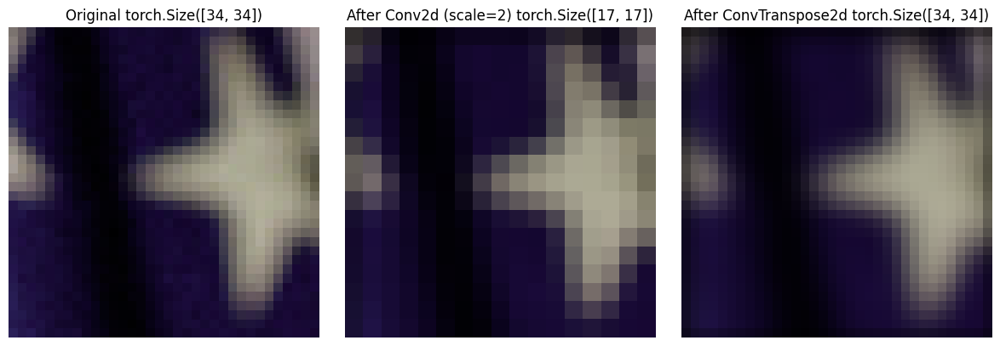

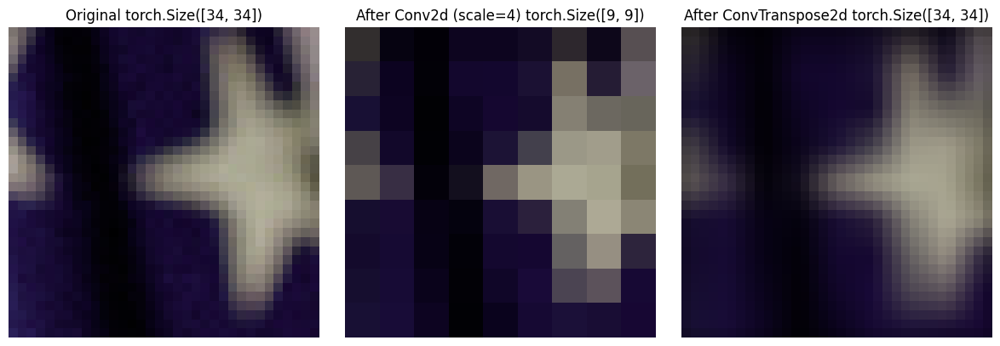

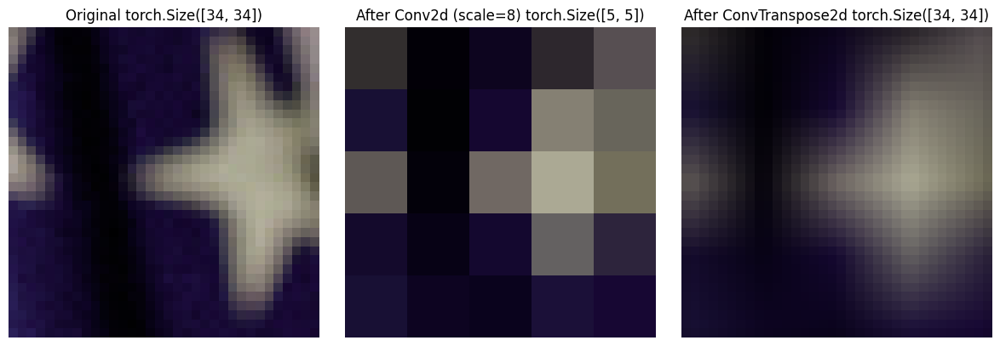

In [36]:
img_tensor_batch = img_tensor[None]
original_size = img_tensor.shape[1]

scales = [2, 4, 8]

for scale in scales:
    channels = 3
    
    conv_kernel = 3
    conv_stride = scale
    conv_padding = 1
    
    conv = nn.Conv2d(channels, channels, kernel_size=conv_kernel, stride=conv_stride, 
                     padding=conv_padding, groups=channels, bias=False)
    
    with torch.no_grad():
        for c in range(channels):
            conv.weight[c, 0].fill_(1.0 / 9)
        downsampled = conv(img_tensor_batch)
        downsampled_size = downsampled.shape[2]
    
    deconv_kernel = 2 * scale
    deconv_stride = scale
    deconv_padding = scale // 2
    
    deconv = nn.ConvTranspose2d(
        channels, channels,
        kernel_size=deconv_kernel, stride=deconv_stride, padding=deconv_padding,
        groups=channels, bias=False
    )
    
    w2d = filter_bilinear(deconv_kernel)
    with torch.no_grad():
        deconv.weight.zero_()
        for c in range(channels):
            deconv.weight[c, 0] = w2d
        reconstructed_raw = deconv(downsampled)[0]
        
        h, w = reconstructed_raw.shape[1], reconstructed_raw.shape[2]
        crop_h = (h - original_size) // 2
        crop_w = (w - original_size) // 2
        reconstructed = reconstructed_raw[:, crop_h:crop_h+original_size, crop_w:crop_w+original_size].clamp(0, 1)
    
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    
    axes[0].imshow(img_tensor.permute(1,2,0))
    axes[0].set_title(f"Original {img_tensor.shape[1:]}")
    axes[0].axis("off")
    
    axes[1].imshow(downsampled[0].detach().permute(1,2,0).clamp(0,1))
    axes[1].set_title(f"After Conv2d (scale={scale}) {downsampled.shape[2:]}")
    axes[1].axis("off")
    
    axes[2].imshow(reconstructed.detach().permute(1,2,0))
    axes[2].set_title(f"After ConvTranspose2d {reconstructed.shape[1:]}")
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()

### SegNet

SegNet появилась в 2015 г. Данная архитектура состоит из конволюционной и деконволюционной части. Она отчасти повторяет собой архитектуру Autoencoder, где есть кодирующая и декодирующая часть.

Декодирующая часть в SegNet позволяет сделать более плавное разворачивание изображения после того как отработала сверточная часть архитектуры. Благодаря этому границы объектов на изображение определяются более корректно.

Стоит отметить, что в качестве сверточной части могут использоваться различные предтренерованные нейронные сети для решения задач классификации, например различные модификации VGG и ResNet.

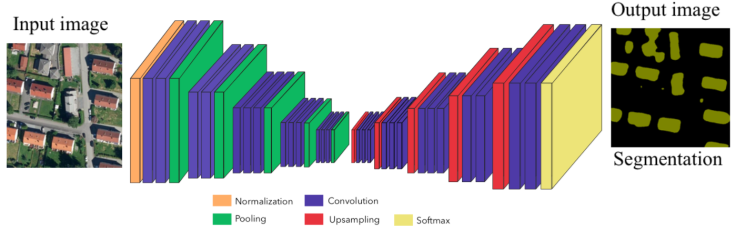

### Задание 3.

    3.1. реализовать сеть SegNet (с глубиной 3, 4, 5, 6 , ...)
    3.2. проверить работу через картинку заглушку (проверить размеры по слоям)
    3.3. Загрузить данные из датасета [https://docs.pytorch.org/vision/stable/generated/torchvision.datasets.OxfordIIITPet.html#torchvision.datasets.OxfordIIITPet]
    3.4 обучить на потерях CELoss или   BCELoss ([https://docs.pytorch.org/docs/stable/generated/torch.nn.modules.loss.CrossEntropyLoss.html])
    3.5. описать проблемы CE(BCE) для сегментации

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegNet(nn.Module):
    def __init__(self, input_channels=3, num_classes=3, depth=5,
                 initial_filters=64, input_size=(224, 224)):
        """
        SegNet модель для семантической сегментации

        Args:
            input_channels (int): количество входных каналов (по умолчанию 3 для RGB)
            num_classes (int): количество классов для сегментации
            depth (int): глубина сети (количество encoder/decoder блоков)
            initial_filters (int): количество фильтров в первом слое
            input_size (tuple): размер входного изображения (height, width)
        """
        super(SegNet, self).__init__()

        self.input_channels = input_channels
        self.num_classes = num_classes
        self.depth = depth
        self.initial_filters = initial_filters
        self.input_size = input_size

        # Encoder layers
        ##
        self.encoders = nn.ModuleList()
        # Decoder layers
        self.decoders = nn.ModuleList()

        self.test = False ## для выводв размеров

        current_channels = input_channels
        current_filters = initial_filters

        # encoder блок
        for i in range(depth):
            # Удваиваем количество фильтров на каждом уровне (кроме первого)
            if i > 0:
                current_filters *= 2

            encoder_block = nn.Sequential(
                nn.Conv2d(current_channels, current_filters, kernel_size=3, padding=1),
                nn.BatchNorm2d(current_filters),
                nn.ReLU(inplace=True),
                nn.Conv2d(current_filters, current_filters, kernel_size=3, padding=1),
                nn.BatchNorm2d(current_filters),
                nn.ReLU(inplace=True)
            )
            self.encoders.append(encoder_block)
            current_channels = current_filters
            print("encoder:", current_channels, current_filters)

        # Максимальный пулинг с индексами
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(current_filters, current_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(current_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(current_filters, current_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(current_filters),
            nn.ReLU(inplace=True)
        )

        # Unpooling слои
        self.unpool = nn.Upsample(scale_factor=2, mode='bilinear')

        # decoder блок
        for i in range(depth):
            # Уменьшаем количество фильтров на каждом уровне (кроме последнего)
            decoder_filters = current_filters
            if i < depth - 1:
                decoder_filters = current_filters // 2

            decoder_block = nn.Sequential(
                nn.Conv2d(current_filters, current_filters, kernel_size=3, padding=1),
                nn.BatchNorm2d(current_filters),
                nn.ReLU(inplace=True),
                nn.Conv2d(current_filters, decoder_filters, kernel_size=3, padding=1),
                nn.BatchNorm2d(decoder_filters),
                nn.ReLU(inplace=True)
            )
            print("decoder:", current_filters, decoder_filters)
            self.decoders.append(decoder_block)
            current_filters = decoder_filters

        # Финальный слой классификации
        self.final_conv = nn.Conv2d(current_filters, num_classes, kernel_size=1)

        # Инициализация весов
        self._initialize_weights()

    def _initialize_weights(self):
        """Инициализация весов сети"""
        # https://apxml.com/courses/pytorch-for-tensorflow-developers/chapter-2-pytorch-nn-module-for-keras-users/weight-initialization-pytorch
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # Encoder
        encoder_outputs = []
        pool_indices = []
        if self.test:
            print("Encoder:")
        for encoder in self.encoders:
            x = encoder(x)
            encoder_outputs.append(x)
            x, indices = self.pool(x)
            pool_indices.append(indices)
            if self.test:
                print(x.shape)

        # Bottleneck
        x = self.bottleneck(x)
        if self.test:
            print("Bottleneck: ")
            print(x.shape)
        # Decoder
        if self.test:
            print("Decoder:")
        for i, decoder in enumerate((self.decoders)):
            # увеличиваем размер кадра
            x = self.unpool(x)
            if self.test:
                print(x.shape)
                print(decoder)
            x = decoder(x)

        # Финальная классификация
        x = self.final_conv(x)

        return x

    def get_output_size(self):
        """
        Возвращает размер выходного тензора для заданного input_size
        """
        # Симулируем прямой проход для вычисления размера выхода
        self.test = True
        with torch.no_grad():
            dummy_input = torch.zeros(1, self.input_channels, *self.input_size)
            output = self.forward(dummy_input)
            return output.shape[2:]  # возвращаем (height, width)
        self.test = False

In [20]:
# Пример использования
model = SegNet(
        input_channels=3,
        num_classes=3,
        depth=4,
        initial_filters=64,
        input_size=(256, 256)
    )

print(f"Модель создана с глубиной {model.depth}")
print(f"Входной размер: {model.input_size}")
print(f"Выходной размер: {model.get_output_size()}")

# Тестовый прогон
x = torch.randn(2, 3, 256, 256)
output = model(x)
print(f"Входной тензор: {x.shape}")
print(f"Выходной тензор: {output.shape}")

encoder: 64 64
encoder: 128 128
encoder: 256 256
encoder: 512 512
decoder: 512 256
decoder: 256 128
decoder: 128 64
decoder: 64 64
Модель создана с глубиной 4
Входной размер: (256, 256)
Encoder:
torch.Size([1, 64, 128, 128])
torch.Size([1, 128, 64, 64])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
Bottleneck: 
torch.Size([1, 512, 16, 16])
Decoder:
torch.Size([1, 512, 32, 32])
Sequential(
  (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
)
torch.Size([1, 256, 64, 64])
Sequential(
  (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(

In [21]:
for d in [3, 4, 5, 6]:
    model = SegNet(input_channels=3, num_classes=3, depth=d, 
                   initial_filters=64, input_size=(256, 256))
    model.test = True
    print(f"модель с глубиной: {d}")
    print(f"ыходной размер: {model.input_size}")
    
    x = torch.randn(2, 3, 256, 256)  
    
    output = model(x)
    
    print(f"input: {x.shape}")
    print(f"output: {output.shape}")
    assert output.shape == (x.shape[0], model.num_classes, *x.shape[2:])

encoder: 64 64
encoder: 128 128
encoder: 256 256
decoder: 256 128
decoder: 128 64
decoder: 64 64
модель с глубиной: 3
ыходной размер: (256, 256)
Encoder:
torch.Size([2, 64, 128, 128])
torch.Size([2, 128, 64, 64])
torch.Size([2, 256, 32, 32])
Bottleneck: 
torch.Size([2, 256, 32, 32])
Decoder:
torch.Size([2, 256, 64, 64])
Sequential(
  (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
)
torch.Size([2, 128, 128, 128])
Sequential(
  (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 

### загрузка датасета

In [69]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

    
# Функция для коллации батча (обработка масок)
def collate_fn(batch):
    images = []
    masks = []
    for image, mask in batch:
        images.append(image)
        # Преобразуем маску: оставляем только первый канал и нормализуем
        mask = mask[0].unsqueeze(0)  # [1, H, W]
        mask = (mask != 2).float()   # 1 - пиксель животного, 0 - фон
        masks.append(mask)

    return torch.stack(images), torch.stack(masks)

def load_oxford_pet_segmentation(data_dir='./data', batch_size=4, image_size=256):
    """
    Загрузка датасета Oxford-IIIT Pet для задачи сегментации
    """

    # Трансформации для изображений и масок
    image_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    mask_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.PILToTensor()
    ])

    # Загружаем датасет с сегментационными масками
    train_dataset = torchvision.datasets.OxfordIIITPet(
        root=data_dir,
        split='trainval',
        target_types='segmentation',
        download=True,
        transform=image_transform,
        target_transform=mask_transform
    )

    test_dataset = torchvision.datasets.OxfordIIITPet(
        root=data_dir,
        split='test',
        target_types='segmentation',
        download=True,
        transform=image_transform,
        target_transform=mask_transform
    )

    train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
        collate_fn=collate_fn
    )

    return train_loader, test_loader, train_dataset, test_dataset

In [79]:
train_loader, test_loader, train_dataset, test_dataset = load_oxford_pet_segmentation(data_dir='./data', batch_size=4, image_size=256)

In [80]:
def visualize_dataset(dataset, num_samples=8):
    """
    Визуализация примеров из датасета
    """
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.ravel()

    for i in range(num_samples):
        image, target = dataset[i]

        # Денормализация изображения
        image = image.numpy().transpose(1, 2, 0)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

        axes[i].imshow(image)
        axes[i].set_title(f'Class: {target}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

def visualize_segmentation(dataset, num_samples=4):
    """
    Визуализация изображений и масок сегментации
    """
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 4))

    for i in range(num_samples):
        image, mask = dataset[i]

        # Денормализация изображения
        image_display = image.numpy().transpose(1, 2, 0)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image_display = std * image_display + mean
        image_display = np.clip(image_display, 0, 1)

        # Отображение изображения
        axes[i, 0].imshow(image_display)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')

        # Отображение маски
        mask_display = mask[0].numpy()  # Берем первый канал
        axes[i, 1].imshow(mask_display, cmap='gray')
        axes[i, 1].set_title('Segmentation Mask')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

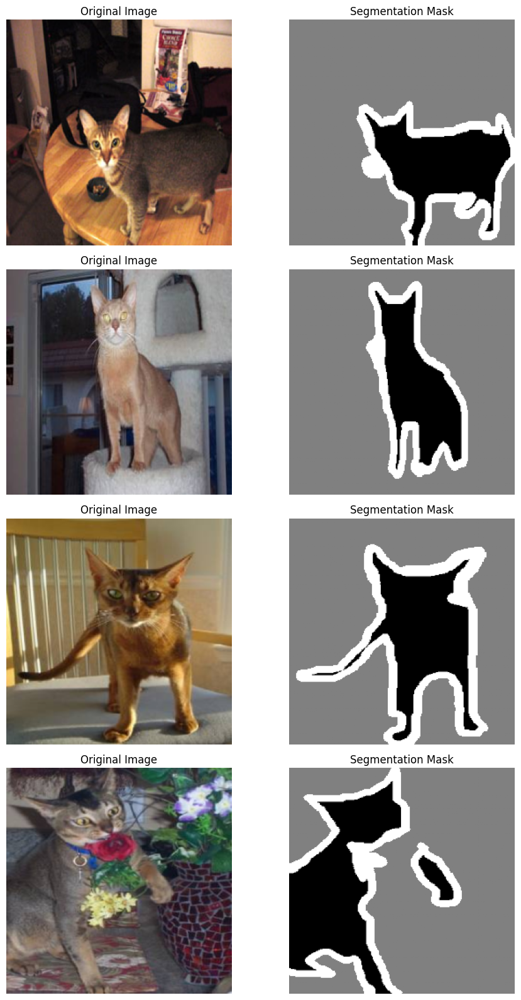

In [81]:
visualize_segmentation(test_dataset, num_samples=4)

Обучение - стандартный цикл

In [82]:
def visualize_prediction(model, dataset, num_samples=4, thr=0.5):
    model.eval()
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples*4))

    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    with torch.no_grad():
        for i in range(num_samples):
            img, mask = dataset[i]
            logits = model(img.unsqueeze(0).to(device))[0,0]     # [H,W]
            prob = torch.sigmoid(logits).cpu().numpy()
            pred = (prob > thr).astype(np.float32)

            # денорм
            img_vis = img.cpu().numpy().transpose(1,2,0)
            img_vis = np.clip(std * img_vis + mean, 0, 1)

            gt = mask[0].numpy()

            axes[i,0].imshow(img_vis); axes[i,0].set_title("Image"); axes[i,0].axis("off")
            axes[i,1].imshow(gt, cmap="gray"); axes[i,1].set_title("GT mask"); axes[i,1].axis("off")
            axes[i,2].imshow(pred, cmap="gray"); axes[i,2].set_title("Pred mask"); axes[i,2].axis("off")

    plt.tight_layout()
    plt.show()


===== depth = 2 =====
encoder: 32 32
encoder: 64 64
decoder: 64 32
decoder: 32 32
depth=2 epoch=1: train_loss=0.5811 val_loss=0.4664
depth=2 epoch=2: train_loss=0.4526 val_loss=0.4062
depth=2 epoch=3: train_loss=0.4179 val_loss=0.4019
depth=2 epoch=4: train_loss=0.3942 val_loss=0.3605
depth=2 epoch=5: train_loss=0.3818 val_loss=0.3578


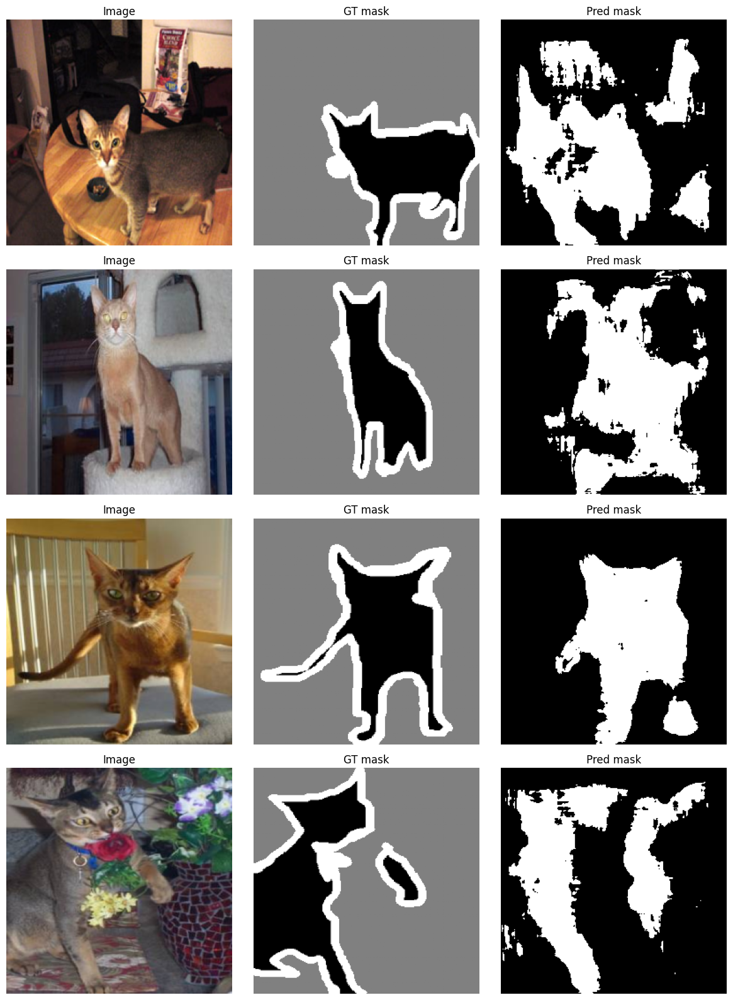


===== depth = 3 =====
encoder: 32 32
encoder: 64 64
encoder: 128 128
decoder: 128 64
decoder: 64 32
decoder: 32 32
depth=3 epoch=1: train_loss=0.5367 val_loss=0.4498
depth=3 epoch=2: train_loss=0.4320 val_loss=0.3799
depth=3 epoch=3: train_loss=0.3807 val_loss=0.3378
depth=3 epoch=4: train_loss=0.3473 val_loss=0.3441
depth=3 epoch=5: train_loss=0.3259 val_loss=0.3015


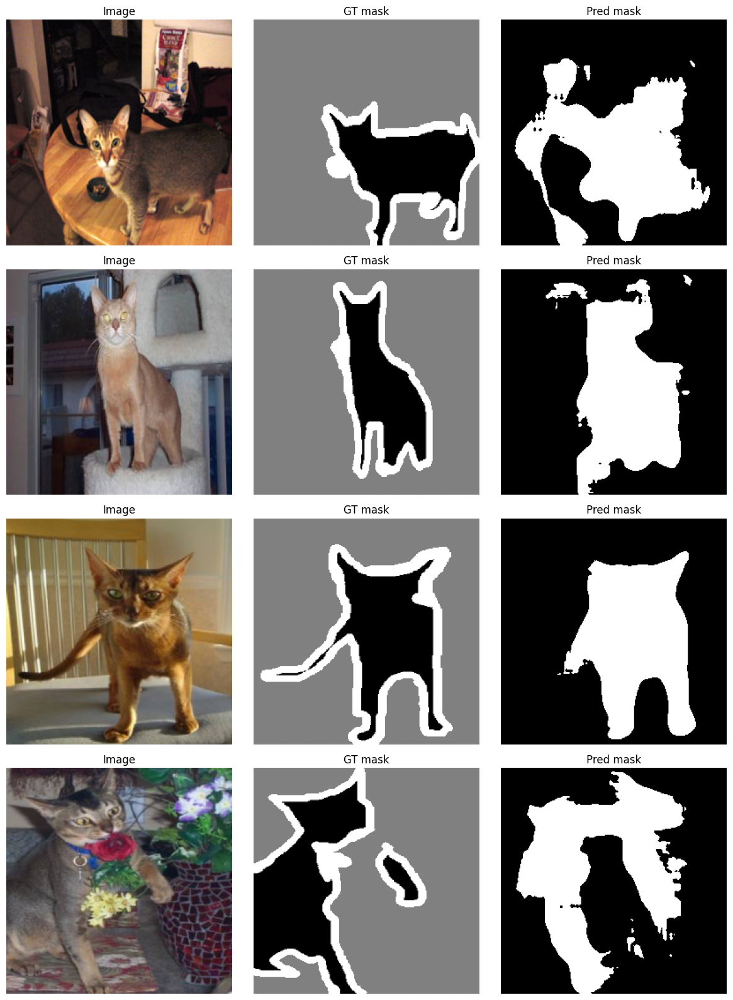


===== depth = 4 =====
encoder: 32 32
encoder: 64 64
encoder: 128 128
encoder: 256 256
decoder: 256 128
decoder: 128 64
decoder: 64 32
decoder: 32 32
depth=4 epoch=1: train_loss=0.4627 val_loss=0.3943
depth=4 epoch=2: train_loss=0.3555 val_loss=0.3299
depth=4 epoch=3: train_loss=0.3178 val_loss=0.2903
depth=4 epoch=4: train_loss=0.2918 val_loss=0.2837
depth=4 epoch=5: train_loss=0.2715 val_loss=0.2526


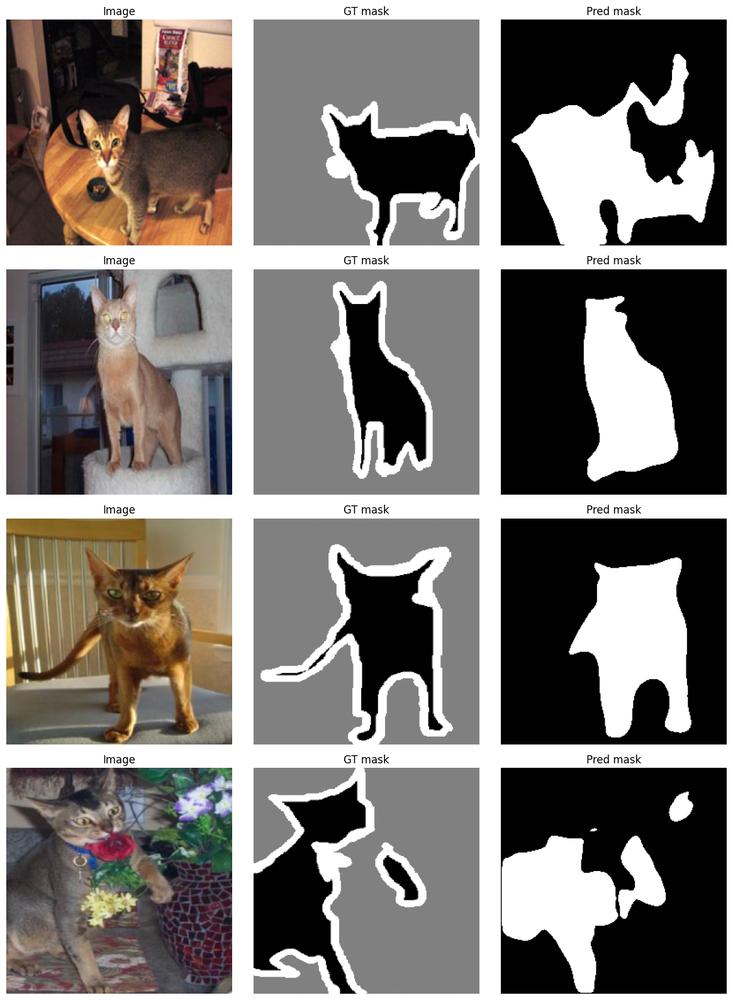


===== depth = 5 =====
encoder: 32 32
encoder: 64 64
encoder: 128 128
encoder: 256 256
encoder: 512 512
decoder: 512 256
decoder: 256 128
decoder: 128 64
decoder: 64 32
decoder: 32 32
depth=5 epoch=1: train_loss=0.4745 val_loss=0.4346
depth=5 epoch=2: train_loss=0.3782 val_loss=0.3615
depth=5 epoch=3: train_loss=0.3292 val_loss=0.3060
depth=5 epoch=4: train_loss=0.3050 val_loss=0.3191
depth=5 epoch=5: train_loss=0.2865 val_loss=0.2615


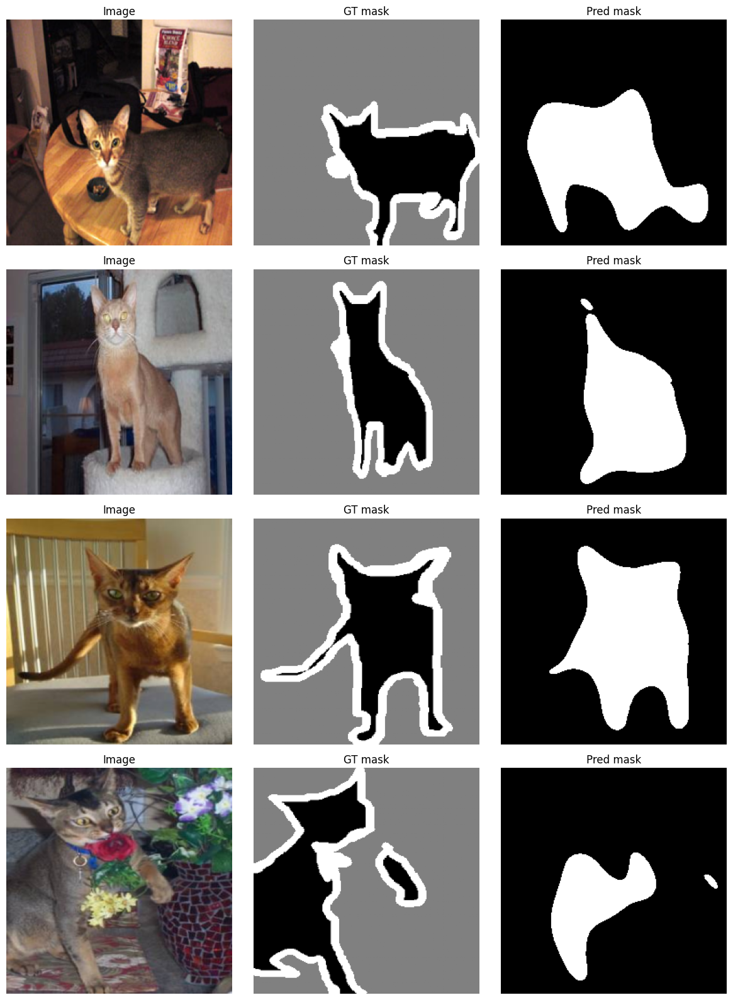


===== depth = 6 =====
encoder: 32 32
encoder: 64 64
encoder: 128 128
encoder: 256 256
encoder: 512 512
encoder: 1024 1024
decoder: 1024 512
decoder: 512 256
decoder: 256 128
decoder: 128 64
decoder: 64 32
decoder: 32 32
depth=6 epoch=1: train_loss=0.5297 val_loss=0.4996
depth=6 epoch=2: train_loss=0.4632 val_loss=0.4330
depth=6 epoch=3: train_loss=0.4100 val_loss=0.3607
depth=6 epoch=4: train_loss=0.3808 val_loss=0.3539
depth=6 epoch=5: train_loss=0.3469 val_loss=0.3160


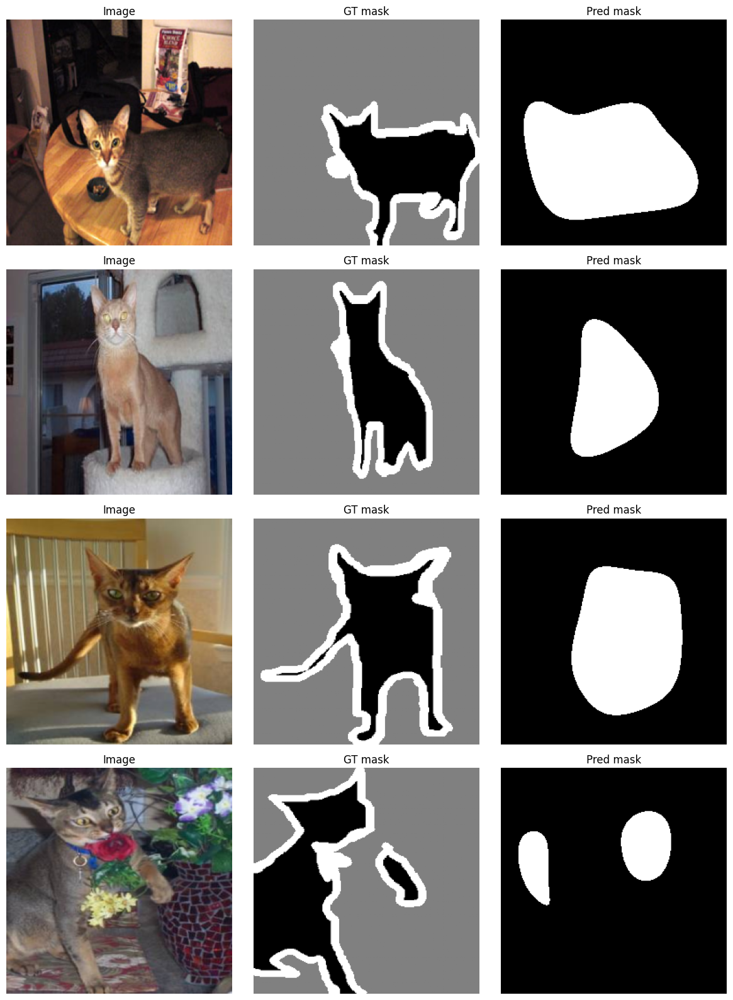

In [83]:
device = torch.device("cuda")

def train_one_epoch(model, loader):
    model.train()
    total_loss = 0.0
    for imgs, masks in loader:
        imgs = imgs.to(device)
        masks = masks.to(device)
        optimizer.zero_grad()
        logits = model(imgs)               # [B,1,H,W]
        loss = criterion(logits, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)

def eval_one_epoch(model, loader):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for imgs, masks in loader:
            imgs = imgs.to(device)
            masks = masks.to(device)
            logits = model(imgs)
            loss = criterion(logits, masks)
            total_loss += loss.item() * imgs.size(0)
    return total_loss / len(loader.dataset)
    
for d in range(2, 7):
    print(f"\n===== depth = {d} =====")
    model = SegNet(input_channels=3, num_classes=1, depth=d,
                   initial_filters=32, input_size=(256,256)).to(device)

    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    for epoch in range(1, 6):
        train_loss = train_one_epoch(model, train_loader)
        val_loss = eval_one_epoch(model, test_loader)
        print(f"depth={d} epoch={epoch}: train_loss={train_loss:.4f} val_loss={val_loss:.4f}")

    visualize_prediction(model, test_dataset, num_samples=4)

### Проблемы BCE для сегментации

1. Дисбаланс классов: фон занимает большее в несколько раз число пикселей, чем объект. Поэтому модель учится предсказывать, что всё - это фон.
2. Не учитывает пространственную структуру - картинка с разбросанными пикселями котика будет давать такой же BCE loss с GT, что и компактное предсказание котика. 
3. Не оптимизирует метрики сегментации, например  IoU

Помочь может Focal Loss или взвешенный BCE

## Дополнительные материалы

1. [Handwritten Text Segmentation](https://arxiv.org/pdf/1906.05229.pdf)
2. [Сегментация медицинских изображений](https://arxiv.org/abs/1505.04597)
3. [Рекуррентные нейронные сети для семантической обработки](https://imatge-upc.github.io/rsis/)


